In [1]:
from games_db import GamesDB

import numpy as np
import pandas as pd
from pandas.plotting import scatter_matrix
import seaborn as sns
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)
import matplotlib.pyplot as plt 
plt.rc("font", size=14)

In [2]:
# create db instance to retrieve stored games
gamesDB = GamesDB()

# get all games from mongodb as a list of dictionaries
nba_games_raw = gamesDB.retrieve_all()
print(nba_games_raw[0])

# convert list of dictionaries into df
games_df = gamesDB.convert_to_df(nba_games_raw)
print(games_df)

{'_id': ObjectId('5e8b3c9055dca7119bcd0e8f'), 'GAME_DATE_EST': '2019-10-22T00:00:00', 'GAME_SEQUENCE': '1', 'GAME_ID': '0021900001', 'TEAM_ID': '1610612740', 'TEAM_ABBREVIATION': 'NOP', 'TEAM_CITY_NAME': 'New Orleans', 'TEAM_NAME': 'Pelicans', 'TEAM_WINS_LOSSES': '0-1', 'PTS_QTR1': '30', 'PTS_QTR2': '31', 'PTS_QTR3': '25', 'PTS_QTR4': '31', 'PTS_OT1': '5', 'PTS_OT2': '0', 'PTS_OT3': '0', 'PTS_OT4': '0', 'PTS_OT5': '0', 'PTS_OT6': '0', 'PTS_OT7': '0', 'PTS_OT8': '0', 'PTS_OT9': '0', 'PTS_OT10': '0', 'PTS': '122', 'FG_PCT': '0.422', 'FT_PCT': '0.85', 'FG3_PCT': '0.422', 'AST': '30', 'REB': '53', 'TOV': '19'}
                           _id        GAME_DATE_EST GAME_SEQUENCE     GAME_ID  \
0     5e8b3c9055dca7119bcd0e8f  2019-10-22T00:00:00             1  0021900001   
1     5e8b3c9055dca7119bcd0e91  2019-10-22T00:00:00             1  0021900001   
2     5e8b3c9055dca7119bcd0e93  2019-10-22T00:00:00             2  0021900002   
3     5e8b3c9055dca7119bcd0e95  2019-10-22T00:00:00           

In [3]:
print(games_df.shape)
print(games_df.columns)
print(games_df.dtypes)

(1944, 30)
Index(['_id', 'GAME_DATE_EST', 'GAME_SEQUENCE', 'GAME_ID', 'TEAM_ID',
       'TEAM_ABBREVIATION', 'TEAM_CITY_NAME', 'TEAM_NAME', 'TEAM_WINS_LOSSES',
       'PTS_QTR1', 'PTS_QTR2', 'PTS_QTR3', 'PTS_QTR4', 'PTS_OT1', 'PTS_OT2',
       'PTS_OT3', 'PTS_OT4', 'PTS_OT5', 'PTS_OT6', 'PTS_OT7', 'PTS_OT8',
       'PTS_OT9', 'PTS_OT10', 'PTS', 'FG_PCT', 'FT_PCT', 'FG3_PCT', 'AST',
       'REB', 'TOV'],
      dtype='object')
_id                  object
GAME_DATE_EST        object
GAME_SEQUENCE        object
GAME_ID              object
TEAM_ID              object
TEAM_ABBREVIATION    object
TEAM_CITY_NAME       object
TEAM_NAME            object
TEAM_WINS_LOSSES     object
PTS_QTR1             object
PTS_QTR2             object
PTS_QTR3             object
PTS_QTR4             object
PTS_OT1              object
PTS_OT2              object
PTS_OT3              object
PTS_OT4              object
PTS_OT5              object
PTS_OT6              object
PTS_OT7              object
PTS_OT8    

In [4]:
obj_cols = ['PTS_QTR1', 'PTS_QTR2', 'PTS_QTR3', 'PTS_QTR4', 'PTS_OT1', 'PTS_OT2', 'PTS_OT3', 'PTS_OT4', 'PTS_OT5', 'PTS_OT6', 'PTS_OT7', 'PTS_OT8', 'PTS_OT9', 'PTS_OT10', 'PTS', 'FG_PCT', 'FT_PCT', 'FG3_PCT', 'AST', 'REB', 'TOV']

games_df[obj_cols] = games_df[obj_cols].apply(pd.to_numeric, errors='coerce')

str_cols = ['GAME_DATE_EST', 'GAME_SEQUENCE', 'GAME_ID', 'TEAM_ID', 'TEAM_ID', 'TEAM_ABBREVIATION', 'TEAM_CITY_NAME', 'TEAM_NAME', 'TEAM_WINS_LOSSES']

games_df[str_cols] = games_df[str_cols].astype('str')

In [5]:
print(games_df.head(12))

_id        GAME_DATE_EST GAME_SEQUENCE     GAME_ID  \
0   5e8b3c9055dca7119bcd0e8f  2019-10-22T00:00:00             1  0021900001   
1   5e8b3c9055dca7119bcd0e91  2019-10-22T00:00:00             1  0021900001   
2   5e8b3c9055dca7119bcd0e93  2019-10-22T00:00:00             2  0021900002   
3   5e8b3c9055dca7119bcd0e95  2019-10-22T00:00:00             2  0021900002   
4   5e8b3c9155dca7119bcd0e97  2019-10-23T00:00:00             1  0021900003   
5   5e8b3c9155dca7119bcd0e99  2019-10-23T00:00:00             1  0021900003   
6   5e8b3c9155dca7119bcd0e9b  2019-10-23T00:00:00             2  0021900004   
7   5e8b3c9155dca7119bcd0e9d  2019-10-23T00:00:00             2  0021900004   
8   5e8b3c9155dca7119bcd0e9f  2019-10-23T00:00:00             3  0021900005   
9   5e8b3c9155dca7119bcd0ea1  2019-10-23T00:00:00             3  0021900005   
10  5e8b3c9155dca7119bcd0ea3  2019-10-23T00:00:00             4  0021900006   
11  5e8b3c9155dca7119bcd0ea5  2019-10-23T00:00:00             4  0021900006  

In [6]:
games_df.describe()

,PTS_QTR1,PTS_QTR2,PTS_QTR3,PTS_QTR4,PTS_OT1,PTS_OT2,PTS_OT3,PTS_OT4,PTS_OT5,PTS_OT6,...,PTS_OT8,PTS_OT9,PTS_OT10,PTS,FG_PCT,FT_PCT,FG3_PCT,AST,REB,TOV
count,1944.000000,1944.000000,1944.000000,1944.000000,1944.000000,1944.000000,1944.0,1944.0,1944.0,1944.0,...,1944.0,1944.0,1944.0,1944.000000,1944.000000,1944.000000,1944.000000,1944.000000,1944.000000,1944.000000
mean,27.898663,28.100823,27.697531,27.072016,0.675412,0.047840,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,111.492284,0.460948,0.768782,0.356963,24.361626,44.864712,13.885802
std,6.016149,5.818769,6.118497,6.080770,2.807624,0.695752,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,12.485336,0.054985,0.101776,0.085486,4.921555,6.736318,4.061205
min,9.000000,10.000000,10.000000,6.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,73.000000,0.269000,0.375000,0.094000,11.000000,25.000000,3.000000
25%,24.000000,24.000000,23.000000,23.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,103.000000,0.422000,0.704000,0.300000,21.000000,40.000000,11.000000
50%,28.000000,28.000000,28.000000,27.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,111.000000,0.460000,0.774000,0.357000,24.000000,45.000000,14.000000
75%,32.000000,32.000000,32.000000,31.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,120.000000,0.500000,0.839000,0.415000,28.000000,49.000000,17.000000
max,53.000000,51.000000,49.000000,51.000000,21.000000,14.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,159.000000,0.674000,1.000000,0.680000,43.000000,67.000000,28.000000


In [7]:
win_col = []

# loop through df and assign binary var who won
for index, row in games_df.iterrows():
    # get opponent for game id 
    game_id = row['GAME_ID']
    team_id = row['TEAM_ID']
    opponent_row = games_df[(games_df['GAME_ID'] == game_id) & (games_df['TEAM_ID'] != team_id)]
    opponent_score = int(opponent_row['PTS'].values[0])

    row_score = int(row['PTS'])

    # get score of opponent and assign winner 
    is_winner = 1 if opponent_score < row_score else 0
    win_col.append(is_winner)

print(len(win_col))

games_df["IS_WINNER"] = win_col

1944


In [8]:
games_df[(games_df['TEAM_ID'] == "1610616834")]

,_id,GAME_DATE_EST,GAME_SEQUENCE,GAME_ID,TEAM_ID,TEAM_ABBREVIATION,TEAM_CITY_NAME,TEAM_NAME,TEAM_WINS_LOSSES,PTS_QTR1,...,PTS_OT9,PTS_OT10,PTS,FG_PCT,FT_PCT,FG3_PCT,AST,REB,TOV,IS_WINNER
1943,5e8cc2f5fe274128a4fb69e9,2020-02-16T00:00:00,1,0031900001,1610616834,LBN,Team,LeBron,1-0,53,...,0,0,157,0.5,0.55,0.343,39,49,18,1


In [9]:
print(list(gamesDB.games_db.find({"TEAM_ID":"1610616833"})))

[{'_id': ObjectId('5e8c6c462371b2dbaa0b49d5'), 'TEAM_CITY_NAME': 'Team', 'GAME_DATE_EST': '2020-02-16T00:00:00', 'PTS_OT10': '0', 'TEAM_ID': '1610616833', 'REB': '61', 'TEAM_NAME': 'Giannis', 'TEAM_WINS_LOSSES': '0-1', 'GAME_SEQUENCE': '1', 'TEAM_ABBREVIATION': 'GNS', 'PTS_OT8': '0', 'PTS_OT9': '0', 'PTS_OT2': '0', 'PTS_OT3': '0', 'PTS_OT1': '0', 'PTS': '155', 'PTS_OT7': '0', 'PTS_OT4': '0', 'PTS_OT5': '0', 'TOV': '21', 'GAME_ID': '0031900001', 'FT_PCT': '0.632', 'PTS_OT6': '0', 'FG_PCT': '0.537', 'AST': '38', 'FG3_PCT': '0.275', 'PTS_QTR3': '41', 'PTS_QTR2': '51', 'PTS_QTR1': '41', 'PTS_QTR4': '22'}]


In [10]:
games_df.head()

,_id,GAME_DATE_EST,GAME_SEQUENCE,GAME_ID,TEAM_ID,TEAM_ABBREVIATION,TEAM_CITY_NAME,TEAM_NAME,TEAM_WINS_LOSSES,PTS_QTR1,...,PTS_OT9,PTS_OT10,PTS,FG_PCT,FT_PCT,FG3_PCT,AST,REB,TOV,IS_WINNER
0,5e8b3c9055dca7119bcd0e8f,2019-10-22T00:00:00,1,0021900001,1610612740,NOP,New Orleans,Pelicans,0-1,30,...,0,0,122,0.422,0.850,0.422,30,53,19,0
1,5e8b3c9055dca7119bcd0e91,2019-10-22T00:00:00,1,0021900001,1610612761,TOR,Toronto,Raptors,1-0,27,...,0,0,130,0.408,0.842,0.350,23,57,16,1
2,5e8b3c9055dca7119bcd0e93,2019-10-22T00:00:00,2,0021900002,1610612747,LAL,Los Angeles,Lakers,0-1,25,...,0,0,102,0.435,0.714,0.394,20,41,14,0
3,5e8b3c9055dca7119bcd0e95,2019-10-22T00:00:00,2,0021900002,1610612746,LAC,LA,Clippers,1-0,22,...,0,0,112,0.519,0.708,0.355,24,45,14,1
4,5e8b3c9155dca7119bcd0e97,2019-10-23T00:00:00,1,0021900003,1610612741,CHI,Chicago,Bulls,0-1,28,...,0,0,125,0.467,0.818,0.300,25,49,10,0


## Exploratory Data Analysis

In [11]:
games_df.describe()

,PTS_QTR1,PTS_QTR2,PTS_QTR3,PTS_QTR4,PTS_OT1,PTS_OT2,PTS_OT3,PTS_OT4,PTS_OT5,PTS_OT6,...,PTS_OT9,PTS_OT10,PTS,FG_PCT,FT_PCT,FG3_PCT,AST,REB,TOV,IS_WINNER
count,1944.000000,1944.000000,1944.000000,1944.000000,1944.000000,1944.000000,1944.0,1944.0,1944.0,1944.0,...,1944.0,1944.0,1944.000000,1944.000000,1944.000000,1944.000000,1944.000000,1944.000000,1944.000000,1944.000000
mean,27.898663,28.100823,27.697531,27.072016,0.675412,0.047840,0.0,0.0,0.0,0.0,...,0.0,0.0,111.492284,0.460948,0.768782,0.356963,24.361626,44.864712,13.885802,0.500000
std,6.016149,5.818769,6.118497,6.080770,2.807624,0.695752,0.0,0.0,0.0,0.0,...,0.0,0.0,12.485336,0.054985,0.101776,0.085486,4.921555,6.736318,4.061205,0.500129
min,9.000000,10.000000,10.000000,6.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,73.000000,0.269000,0.375000,0.094000,11.000000,25.000000,3.000000,0.000000
25%,24.000000,24.000000,23.000000,23.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,103.000000,0.422000,0.704000,0.300000,21.000000,40.000000,11.000000,0.000000
50%,28.000000,28.000000,28.000000,27.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,111.000000,0.460000,0.774000,0.357000,24.000000,45.000000,14.000000,0.500000
75%,32.000000,32.000000,32.000000,31.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,120.000000,0.500000,0.839000,0.415000,28.000000,49.000000,17.000000,1.000000
max,53.000000,51.000000,49.000000,51.000000,21.000000,14.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,159.000000,0.674000,1.000000,0.680000,43.000000,67.000000,28.000000,1.000000


In [12]:
games_df['IS_WINNER'].value_counts()

1    972
0    972
Name: IS_WINNER, dtype: int64

In [13]:
games_df.groupby('IS_WINNER').mean()

,PTS_QTR1,PTS_QTR2,PTS_QTR3,PTS_QTR4,PTS_OT1,PTS_OT2,PTS_OT3,PTS_OT4,PTS_OT5,PTS_OT6,...,PTS_OT8,PTS_OT9,PTS_OT10,PTS,FG_PCT,FT_PCT,FG3_PCT,AST,REB,TOV
IS_WINNER,,,,,,,,,,,,,,,,,,,,,
0,26.385802,26.816872,26.220165,25.750000,0.530864,0.037037,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,105.740741,0.435853,0.759907,0.328004,23.109053,42.662551,14.091564
1,29.411523,29.384774,29.174897,28.394033,0.819959,0.058642,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,117.243827,0.486042,0.777656,0.385922,25.614198,47.066872,13.680041


In [14]:
print(games_df.dtypes)

_id                   object
GAME_DATE_EST         object
GAME_SEQUENCE         object
GAME_ID               object
TEAM_ID               object
TEAM_ABBREVIATION     object
TEAM_CITY_NAME        object
TEAM_NAME             object
TEAM_WINS_LOSSES      object
PTS_QTR1               int64
PTS_QTR2               int64
PTS_QTR3               int64
PTS_QTR4               int64
PTS_OT1                int64
PTS_OT2                int64
PTS_OT3                int64
PTS_OT4                int64
PTS_OT5                int64
PTS_OT6                int64
PTS_OT7                int64
PTS_OT8                int64
PTS_OT9                int64
PTS_OT10               int64
PTS                    int64
FG_PCT               float64
FT_PCT               float64
FG3_PCT              float64
AST                    int64
REB                    int64
TOV                    int64
IS_WINNER              int64
dtype: object


In [15]:
drop_cols = ['_id', 'PTS_OT3', 'PTS_OT4', 'PTS_OT5', 'PTS_OT6', 'PTS_OT7', 'PTS_OT8', 'PTS_OT9', 'PTS_OT10']
games_df.drop(drop_cols, axis=1, inplace=True)

### Feature Engineering

In [16]:
# split win loss into two columns
games_df[['WINS','LOSSES']] = games_df['TEAM_WINS_LOSSES'].str.split("-",expand=True)
games_df[['WINS','LOSSES']].head()

,WINS,LOSSES
0,0,1
1,1,0
2,0,1
3,1,0
4,0,1


In [17]:
# create unique list of team ids
unique_team_ids = games_df['TEAM_ID'].unique()

# create a data frame dictionary to store data frames by team_id
games_by_team = {elem : pd.DataFrame for elem in unique_team_ids}

for key in games_by_team.keys():
    games_by_team[key] = games_df[:][games_df['TEAM_ID'] == key]

In [18]:
games_by_team['1610612743']

,GAME_DATE_EST,GAME_SEQUENCE,GAME_ID,TEAM_ID,TEAM_ABBREVIATION,TEAM_CITY_NAME,TEAM_NAME,TEAM_WINS_LOSSES,PTS_QTR1,PTS_QTR2,...,PTS,FG_PCT,FT_PCT,FG3_PCT,AST,REB,TOV,IS_WINNER,WINS,LOSSES
24,2019-10-23T00:00:00,11,0021900013,1610612743,DEN,Denver,Nuggets,1-0,24,30,...,108,0.420,0.815,0.563,24,45,19,1,1,0
45,2019-10-25T00:00:00,7,0021900023,1610612743,DEN,Denver,Nuggets,2-0,15,24,...,108,0.391,0.806,0.259,21,45,14,1,2,0
98,2019-10-28T00:00:00,10,0021900050,1610612743,DEN,Denver,Nuggets,3-0,21,26,...,101,0.367,0.905,0.278,19,54,10,1,3,0
105,2019-10-29T00:00:00,2,0021900053,1610612743,DEN,Denver,Nuggets,3-1,31,30,...,106,0.473,0.692,0.344,24,50,10,0,3,1
132,2019-10-31T00:00:00,2,0021900067,1610612743,DEN,Denver,Nuggets,3-2,30,22,...,107,0.483,0.875,0.269,24,35,14,0,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1824,2020-03-03T00:00:00,5,0021900913,1610612743,DEN,Denver,Nuggets,41-20,25,33,...,100,0.448,0.731,0.150,22,53,15,0,41,20
1849,2020-03-05T00:00:00,1,0021900926,1610612743,DEN,Denver,Nuggets,42-20,31,29,...,114,0.530,0.900,0.308,29,38,12,1,42,20
1881,2020-03-07T00:00:00,3,0021900942,1610612743,DEN,Denver,Nuggets,42-21,33,28,...,102,0.506,0.375,0.406,28,33,17,0,42,21
1914,2020-03-09T00:00:00,2,0021900958,1610612743,DEN,Denver,Nuggets,43-21,39,23,...,109,0.436,0.917,0.390,28,48,12,1,43,21


In [19]:
games_by_team['1610612764']

,GAME_DATE_EST,GAME_SEQUENCE,GAME_ID,TEAM_ID,TEAM_ABBREVIATION,TEAM_CITY_NAME,TEAM_NAME,TEAM_WINS_LOSSES,PTS_QTR1,PTS_QTR2,...,PTS,FG_PCT,FT_PCT,FG3_PCT,AST,REB,TOV,IS_WINNER,WINS,LOSSES
16,2019-10-23T00:00:00,7,0021900009,1610612764,WAS,Washington,Wizards,0-1,25,23,...,100,0.398,0.833,0.268,26,47,17,0,0,1
42,2019-10-25T00:00:00,6,0021900022,1610612764,WAS,Washington,Wizards,1-1,28,24,...,97,0.402,0.800,0.268,21,47,15,1,1,1
64,2019-10-26T00:00:00,8,0021900033,1610612764,WAS,Washington,Wizards,1-2,26,34,...,122,0.495,0.706,0.471,30,41,12,0,1,2
121,2019-10-30T00:00:00,7,0021900061,1610612764,WAS,Washington,Wizards,1-3,34,43,...,158,0.626,0.828,0.556,31,40,19,0,1,3
159,2019-11-02T00:00:00,4,0021900080,1610612764,WAS,Washington,Wizards,1-4,34,22,...,109,0.389,0.852,0.343,21,39,17,0,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1829,2020-03-03T00:00:00,8,0021900916,1610612764,WAS,Washington,Wizards,22-38,23,26,...,126,0.513,0.824,0.421,28,31,14,0,22,38
1847,2020-03-04T00:00:00,9,0021900925,1610612764,WAS,Washington,Wizards,22-39,30,31,...,104,0.388,0.619,0.314,27,48,10,0,22,39
1858,2020-03-06T00:00:00,1,0021900930,1610612764,WAS,Washington,Wizards,23-39,33,31,...,118,0.474,0.886,0.484,24,38,16,1,23,39
1900,2020-03-08T00:00:00,6,0021900951,1610612764,WAS,Washington,Wizards,23-40,23,31,...,89,0.333,0.857,0.404,19,29,13,0,23,40


In [20]:
# calculate running average 
def running_avg(data):
    running_avg = []

    for i in range(len(data)):
        avg = sum(data[:i+1]) / (i + 1)
        running_avg.append(avg)
    return running_avg
    
print(running_avg(games_by_team['1610612743']['PTS']))

[108.0, 108.0, 105.66666666666667, 105.75, 106.0, 103.5, 104.28571428571429, 103.75, 103.33333333333333, 105.1, 104.72727272727273, 106.91666666666667, 106.76923076923077, 106.0, 106.66666666666667, 107.3125, 106.70588235294117, 106.11111111111111, 107.3157894736842, 106.7, 106.47619047619048, 105.81818181818181, 106.17391304347827, 106.33333333333333, 106.52, 106.76923076923077, 106.85185185185185, 107.60714285714286, 107.79310344827586, 107.53333333333333, 107.90322580645162, 108.28125, 108.15151515151516, 108.61764705882354, 108.77142857142857, 109.16666666666667, 109.10810810810811, 108.94736842105263, 109.07692307692308, 108.85, 109.46341463414635, 109.4047619047619, 109.34883720930233, 109.25, 109.33333333333333, 109.5, 109.2127659574468, 109.14583333333333, 109.51020408163265, 109.78, 110.11764705882354, 109.88461538461539, 110.01886792452831, 110.33333333333333, 110.43636363636364, 110.26785714285714, 110.57894736842105, 110.65517241379311, 110.52542372881356, 110.9, 110.721311

In [21]:
def calc_dynamic_features(games_dic):

    for df_key in games_dic.keys():
        print("Calculating features for team: {}".format(df_key))

        # for every numeric column calculate running average
        cols = games_by_team[df_key].select_dtypes([np.number]).columns
        print("Numeric columns: {}".format(cols))

        data = {}

        # calculate average at point t 
        for col in cols:
            data[col + '_AVG'] = running_avg(games_by_team[df_key][col])

        avg_features = pd.DataFrame(data)

        # concatenate new features to old df
        games_by_team[df_key] = pd.concat([games_by_team[df_key], avg_features.set_index(games_by_team[df_key].index)], axis=1)

calc_dynamic_features(games_by_team)

Calculating features for team: 1610612740
Numeric columns: Index(['PTS_QTR1', 'PTS_QTR2', 'PTS_QTR3', 'PTS_QTR4', 'PTS_OT1', 'PTS_OT2',
       'PTS', 'FG_PCT', 'FT_PCT', 'FG3_PCT', 'AST', 'REB', 'TOV', 'IS_WINNER'],
      dtype='object')
Calculating features for team: 1610612761
Numeric columns: Index(['PTS_QTR1', 'PTS_QTR2', 'PTS_QTR3', 'PTS_QTR4', 'PTS_OT1', 'PTS_OT2',
       'PTS', 'FG_PCT', 'FT_PCT', 'FG3_PCT', 'AST', 'REB', 'TOV', 'IS_WINNER'],
      dtype='object')
Calculating features for team: 1610612747
Numeric columns: Index(['PTS_QTR1', 'PTS_QTR2', 'PTS_QTR3', 'PTS_QTR4', 'PTS_OT1', 'PTS_OT2',
       'PTS', 'FG_PCT', 'FT_PCT', 'FG3_PCT', 'AST', 'REB', 'TOV', 'IS_WINNER'],
      dtype='object')
Calculating features for team: 1610612746
Numeric columns: Index(['PTS_QTR1', 'PTS_QTR2', 'PTS_QTR3', 'PTS_QTR4', 'PTS_OT1', 'PTS_OT2',
       'PTS', 'FG_PCT', 'FT_PCT', 'FG3_PCT', 'AST', 'REB', 'TOV', 'IS_WINNER'],
      dtype='object')
Calculating features for team: 1610612741
Numeri

In [22]:
games_by_team['1610612764']

,GAME_DATE_EST,GAME_SEQUENCE,GAME_ID,TEAM_ID,TEAM_ABBREVIATION,TEAM_CITY_NAME,TEAM_NAME,TEAM_WINS_LOSSES,PTS_QTR1,PTS_QTR2,...,PTS_OT1_AVG,PTS_OT2_AVG,PTS_AVG,FG_PCT_AVG,FT_PCT_AVG,FG3_PCT_AVG,AST_AVG,REB_AVG,TOV_AVG,IS_WINNER_AVG
16,2019-10-23T00:00:00,7,0021900009,1610612764,WAS,Washington,Wizards,0-1,25,23,...,0.000000,0.0,100.000000,0.398000,0.833000,0.268000,26.000000,47.000000,17.000000,0.000000
42,2019-10-25T00:00:00,6,0021900022,1610612764,WAS,Washington,Wizards,1-1,28,24,...,0.000000,0.0,98.500000,0.400000,0.816500,0.268000,23.500000,47.000000,16.000000,0.500000
64,2019-10-26T00:00:00,8,0021900033,1610612764,WAS,Washington,Wizards,1-2,26,34,...,0.000000,0.0,106.333333,0.431667,0.779667,0.335667,25.666667,45.000000,14.666667,0.333333
121,2019-10-30T00:00:00,7,0021900061,1610612764,WAS,Washington,Wizards,1-3,34,43,...,0.000000,0.0,119.250000,0.480250,0.791750,0.390750,27.000000,43.750000,15.750000,0.250000
159,2019-11-02T00:00:00,4,0021900080,1610612764,WAS,Washington,Wizards,1-4,34,22,...,0.000000,0.0,117.200000,0.462000,0.803800,0.381200,25.800000,42.800000,16.000000,0.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1829,2020-03-03T00:00:00,8,0021900916,1610612764,WAS,Washington,Wizards,22-38,23,26,...,0.550000,0.0,116.100000,0.465100,0.781100,0.370400,25.466667,41.933333,13.416667,0.366667
1847,2020-03-04T00:00:00,9,0021900925,1610612764,WAS,Washington,Wizards,22-39,30,31,...,0.540984,0.0,115.901639,0.463836,0.778443,0.369475,25.491803,42.032787,13.360656,0.360656
1858,2020-03-06T00:00:00,1,0021900930,1610612764,WAS,Washington,Wizards,23-39,33,31,...,0.532258,0.0,115.935484,0.464000,0.780177,0.371323,25.467742,41.967742,13.403226,0.370968
1900,2020-03-08T00:00:00,6,0021900951,1610612764,WAS,Washington,Wizards,23-40,23,31,...,0.523810,0.0,115.507937,0.461921,0.781397,0.371841,25.365079,41.761905,13.396825,0.365079


In [23]:
test_result = pd.merge(games_by_team['1610612743'], games_by_team['1610612764'], on=['GAME_ID'])
test_result

,GAME_DATE_EST_x,GAME_SEQUENCE_x,GAME_ID,TEAM_ID_x,TEAM_ABBREVIATION_x,TEAM_CITY_NAME_x,TEAM_NAME_x,TEAM_WINS_LOSSES_x,PTS_QTR1_x,PTS_QTR2_x,...,PTS_OT1_AVG_y,PTS_OT2_AVG_y,PTS_AVG_y,FG_PCT_AVG_y,FT_PCT_AVG_y,FG3_PCT_AVG_y,AST_AVG_y,REB_AVG_y,TOV_AVG_y,IS_WINNER_AVG_y
0,2019-11-26T00:00:00,2,0021900252,1610612743,DEN,Denver,Nuggets,13-3,25,39,...,0.000000,0.0,118.066667,0.477133,0.782267,0.371733,28.600000,42.333333,14.066667,0.333333
1,2020-01-04T00:00:00,6,0021900528,1610612743,DEN,Denver,Nuggets,24-11,19,36,...,0.314286,0.0,116.114286,0.461486,0.786343,0.366486,25.971429,42.171429,13.085714,0.314286


In [24]:
# get all team games as list
dfs = list(games_by_team.values())

# Consolidate data into one df
games_df_extended = pd.concat(dfs, axis=0)
print(games_df_extended.shape)

(1944, 38)


In [25]:
games_df['GAME_ID'].nunique()

972

In [26]:
games_df_final = pd.merge(games_df_extended, games_df_extended, on='GAME_ID', how='inner', suffixes=('_HOME', '_AWAY'))
games_df_final = games_df_final.loc[~(games_df_final['TEAM_ID_HOME'] == games_df_final['TEAM_ID_AWAY'])].drop_duplicates(subset=['GAME_ID'], keep='first')
games_df_final

,GAME_DATE_EST_HOME,GAME_SEQUENCE_HOME,GAME_ID,TEAM_ID_HOME,TEAM_ABBREVIATION_HOME,TEAM_CITY_NAME_HOME,TEAM_NAME_HOME,TEAM_WINS_LOSSES_HOME,PTS_QTR1_HOME,PTS_QTR2_HOME,...,PTS_OT1_AVG_AWAY,PTS_OT2_AVG_AWAY,PTS_AVG_AWAY,FG_PCT_AVG_AWAY,FT_PCT_AVG_AWAY,FG3_PCT_AVG_AWAY,AST_AVG_AWAY,REB_AVG_AWAY,TOV_AVG_AWAY,IS_WINNER_AVG_AWAY
1,2019-10-22T00:00:00,1,0021900001,1610612740,NOP,New Orleans,Pelicans,0-1,30,31,...,13.000000,0.0,130.000000,0.408000,0.842000,0.350000,23.000000,57.000000,16.000000,1.000000
5,2019-10-25T00:00:00,5,0021900021,1610612740,NOP,New Orleans,Pelicans,0-2,41,23,...,0.000000,0.0,115.500000,0.472500,0.774500,0.328000,20.000000,47.500000,15.000000,1.000000
9,2019-10-26T00:00:00,7,0021900032,1610612740,NOP,New Orleans,Pelicans,0-3,24,37,...,0.000000,0.0,118.500000,0.412000,0.822000,0.311000,26.000000,51.000000,16.500000,0.500000
13,2019-10-28T00:00:00,7,0021900047,1610612740,NOP,New Orleans,Pelicans,0-4,23,32,...,0.000000,0.0,116.000000,0.403333,0.862667,0.303000,27.000000,47.333333,15.000000,0.333333
17,2019-10-31T00:00:00,2,0021900067,1610612740,NOP,New Orleans,Pelicans,1-4,32,24,...,2.600000,0.0,106.000000,0.426800,0.818600,0.342600,22.400000,45.800000,13.400000,0.600000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3869,2020-01-08T00:00:00,9,0021900562,1610612749,MIL,Milwaukee,Bucks,33-6,19,28,...,0.820513,0.0,104.897436,0.430462,0.804154,0.333282,24.153846,43.974359,14.205128,0.230769
3873,2019-11-06T00:00:00,5,0021900107,1610612745,HOU,Houston,Rockets,5-3,30,33,...,0.000000,0.0,111.750000,0.429875,0.854125,0.344875,25.375000,45.250000,14.000000,0.250000
3877,2019-12-25T00:00:00,3,0021900457,1610612745,HOU,Houston,Rockets,21-10,29,39,...,0.593750,0.0,105.250000,0.432125,0.808938,0.328063,23.968750,43.968750,14.312500,0.250000
3881,2020-02-20T00:00:00,6,0021900825,1610612745,HOU,Houston,Rockets,35-20,38,34,...,1.089286,0.0,106.285714,0.434875,0.807018,0.336571,25.214286,43.000000,14.321429,0.214286


In [27]:
games_df_final.iloc[0][['IS_WINNER_HOME', 'IS_WINNER_AWAY']]

IS_WINNER_HOME    0
IS_WINNER_AWAY    1
Name: 1, dtype: object

In [28]:
pd.set_option('display.max_columns', None)
games_df[games_df['GAME_ID'] == '0021900001']

,GAME_DATE_EST,GAME_SEQUENCE,GAME_ID,TEAM_ID,TEAM_ABBREVIATION,TEAM_CITY_NAME,TEAM_NAME,TEAM_WINS_LOSSES,PTS_QTR1,PTS_QTR2,PTS_QTR3,PTS_QTR4,PTS_OT1,PTS_OT2,PTS,FG_PCT,FT_PCT,FG3_PCT,AST,REB,TOV,IS_WINNER,WINS,LOSSES
0,2019-10-22T00:00:00,1,0021900001,1610612740,NOP,New Orleans,Pelicans,0-1,30,31,25,31,5,0,122,0.422,0.850,0.422,30,53,19,0,0,1
1,2019-10-22T00:00:00,1,0021900001,1610612761,TOR,Toronto,Raptors,1-0,27,29,32,29,13,0,130,0.408,0.842,0.350,23,57,16,1,1,0


In [29]:
games_df_final[games_df_final['GAME_ID'] == '0021900001']

,GAME_DATE_EST_HOME,GAME_SEQUENCE_HOME,GAME_ID,TEAM_ID_HOME,TEAM_ABBREVIATION_HOME,TEAM_CITY_NAME_HOME,TEAM_NAME_HOME,TEAM_WINS_LOSSES_HOME,PTS_QTR1_HOME,PTS_QTR2_HOME,PTS_QTR3_HOME,PTS_QTR4_HOME,PTS_OT1_HOME,PTS_OT2_HOME,PTS_HOME,FG_PCT_HOME,FT_PCT_HOME,FG3_PCT_HOME,AST_HOME,REB_HOME,TOV_HOME,IS_WINNER_HOME,WINS_HOME,LOSSES_HOME,PTS_QTR1_AVG_HOME,PTS_QTR2_AVG_HOME,PTS_QTR3_AVG_HOME,PTS_QTR4_AVG_HOME,PTS_OT1_AVG_HOME,PTS_OT2_AVG_HOME,PTS_AVG_HOME,FG_PCT_AVG_HOME,FT_PCT_AVG_HOME,FG3_PCT_AVG_HOME,AST_AVG_HOME,REB_AVG_HOME,TOV_AVG_HOME,IS_WINNER_AVG_HOME,GAME_DATE_EST_AWAY,GAME_SEQUENCE_AWAY,TEAM_ID_AWAY,TEAM_ABBREVIATION_AWAY,TEAM_CITY_NAME_AWAY,TEAM_NAME_AWAY,TEAM_WINS_LOSSES_AWAY,PTS_QTR1_AWAY,PTS_QTR2_AWAY,PTS_QTR3_AWAY,PTS_QTR4_AWAY,PTS_OT1_AWAY,PTS_OT2_AWAY,PTS_AWAY,FG_PCT_AWAY,FT_PCT_AWAY,FG3_PCT_AWAY,AST_AWAY,REB_AWAY,TOV_AWAY,IS_WINNER_AWAY,WINS_AWAY,LOSSES_AWAY,PTS_QTR1_AVG_AWAY,PTS_QTR2_AVG_AWAY,PTS_QTR3_AVG_AWAY,PTS_QTR4_AVG_AWAY,PTS_OT1_AVG_AWAY,PTS_OT2_AVG_AWAY,PTS_AVG_AWAY,FG_PCT_AVG_AWAY,FT_PCT_AVG_AWAY,FG3_PCT_AVG_AWAY,AST_AVG_AWAY,REB_AVG_AWAY,TOV_AVG_AWAY,IS_WINNER_AVG_AWAY
1,2019-10-22T00:00:00,1,0021900001,1610612740,NOP,New Orleans,Pelicans,0-1,30,31,25,31,5,0,122,0.422,0.85,0.422,30,53,19,0,0,1,30.0,31.0,25.0,31.0,5.0,0.0,122.0,0.422,0.85,0.422,30.0,53.0,19.0,0.0,2019-10-22T00:00:00,1,1610612761,TOR,Toronto,Raptors,1-0,27,29,32,29,13,0,130,0.408,0.842,0.35,23,57,16,1,1,0,27.0,29.0,32.0,29.0,13.0,0.0,130.0,0.408,0.842,0.35,23.0,57.0,16.0,1.0


### Data Exploration

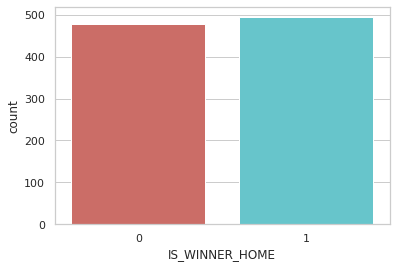

In [30]:
sns.countplot(x='IS_WINNER_HOME',data=games_df_final, palette='hls')
plt.show()

In [31]:
games_df_final.groupby('IS_WINNER_HOME').mean()

,PTS_QTR1_HOME,PTS_QTR2_HOME,PTS_QTR3_HOME,PTS_QTR4_HOME,PTS_OT1_HOME,PTS_OT2_HOME,PTS_HOME,FG_PCT_HOME,FT_PCT_HOME,FG3_PCT_HOME,AST_HOME,REB_HOME,TOV_HOME,PTS_QTR1_AVG_HOME,PTS_QTR2_AVG_HOME,PTS_QTR3_AVG_HOME,PTS_QTR4_AVG_HOME,PTS_OT1_AVG_HOME,PTS_OT2_AVG_HOME,PTS_AVG_HOME,FG_PCT_AVG_HOME,FT_PCT_AVG_HOME,FG3_PCT_AVG_HOME,AST_AVG_HOME,REB_AVG_HOME,TOV_AVG_HOME,IS_WINNER_AVG_HOME,PTS_QTR1_AWAY,PTS_QTR2_AWAY,PTS_QTR3_AWAY,PTS_QTR4_AWAY,PTS_OT1_AWAY,PTS_OT2_AWAY,PTS_AWAY,FG_PCT_AWAY,FT_PCT_AWAY,FG3_PCT_AWAY,AST_AWAY,REB_AWAY,TOV_AWAY,IS_WINNER_AWAY,PTS_QTR1_AVG_AWAY,PTS_QTR2_AVG_AWAY,PTS_QTR3_AVG_AWAY,PTS_QTR4_AVG_AWAY,PTS_OT1_AVG_AWAY,PTS_OT2_AVG_AWAY,PTS_AVG_AWAY,FG_PCT_AVG_AWAY,FT_PCT_AVG_AWAY,FG3_PCT_AVG_AWAY,AST_AVG_AWAY,REB_AVG_AWAY,TOV_AVG_AWAY,IS_WINNER_AVG_AWAY
IS_WINNER_HOME,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,26.370293,26.943515,26.110879,25.830544,0.420502,0.046025,105.721757,0.434847,0.752421,0.329140,23.167364,42.774059,13.949791,27.528310,27.600216,27.258080,26.529069,0.693486,0.015049,109.624210,0.451353,0.759283,0.352092,23.904530,44.933580,14.675652,0.428579,29.146444,29.566946,29.248954,28.483264,0.688285,0.083682,117.217573,0.488188,0.781023,0.380305,25.361925,47.029289,13.642259,1.0,27.668779,28.293238,28.034584,27.558455,0.670885,0.026418,112.252358,0.459914,0.767370,0.352950,23.923196,46.125238,14.358410,0.589242
1,29.668016,29.208502,29.103239,28.307692,0.947368,0.034413,117.269231,0.483966,0.774399,0.391356,25.858300,47.103239,13.716599,27.671699,27.899948,27.873993,26.909365,0.734544,0.011854,111.101403,0.459662,0.767191,0.359054,24.407613,45.457161,14.486555,0.573549,26.400810,26.694332,26.325911,25.672065,0.637652,0.028340,105.759109,0.436826,0.767152,0.326905,23.052632,42.554656,14.228745,0.0,27.225372,27.659402,27.461167,26.996118,0.663137,0.027046,110.032242,0.452248,0.771701,0.348758,23.620797,44.795345,14.590598,0.412104


Text(0, 0.5, 'Frequency of Home Win')

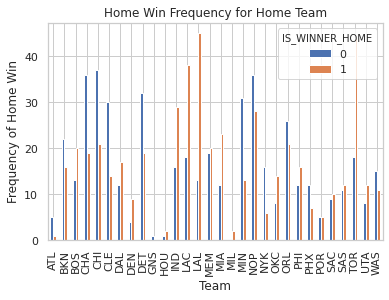

In [32]:
%matplotlib inline
pd.crosstab(games_df_final['TEAM_ABBREVIATION_HOME'], games_df_final['IS_WINNER_HOME']).plot(kind='bar')
plt.title('Home Win Frequency for Home Team')
plt.xlabel('Team')
plt.ylabel('Frequency of Home Win')

In [33]:
games_df.columns

Index(['GAME_DATE_EST', 'GAME_SEQUENCE', 'GAME_ID', 'TEAM_ID',
       'TEAM_ABBREVIATION', 'TEAM_CITY_NAME', 'TEAM_NAME', 'TEAM_WINS_LOSSES',
       'PTS_QTR1', 'PTS_QTR2', 'PTS_QTR3', 'PTS_QTR4', 'PTS_OT1', 'PTS_OT2',
       'PTS', 'FG_PCT', 'FT_PCT', 'FG3_PCT', 'AST', 'REB', 'TOV', 'IS_WINNER',
       'WINS', 'LOSSES'],
      dtype='object')

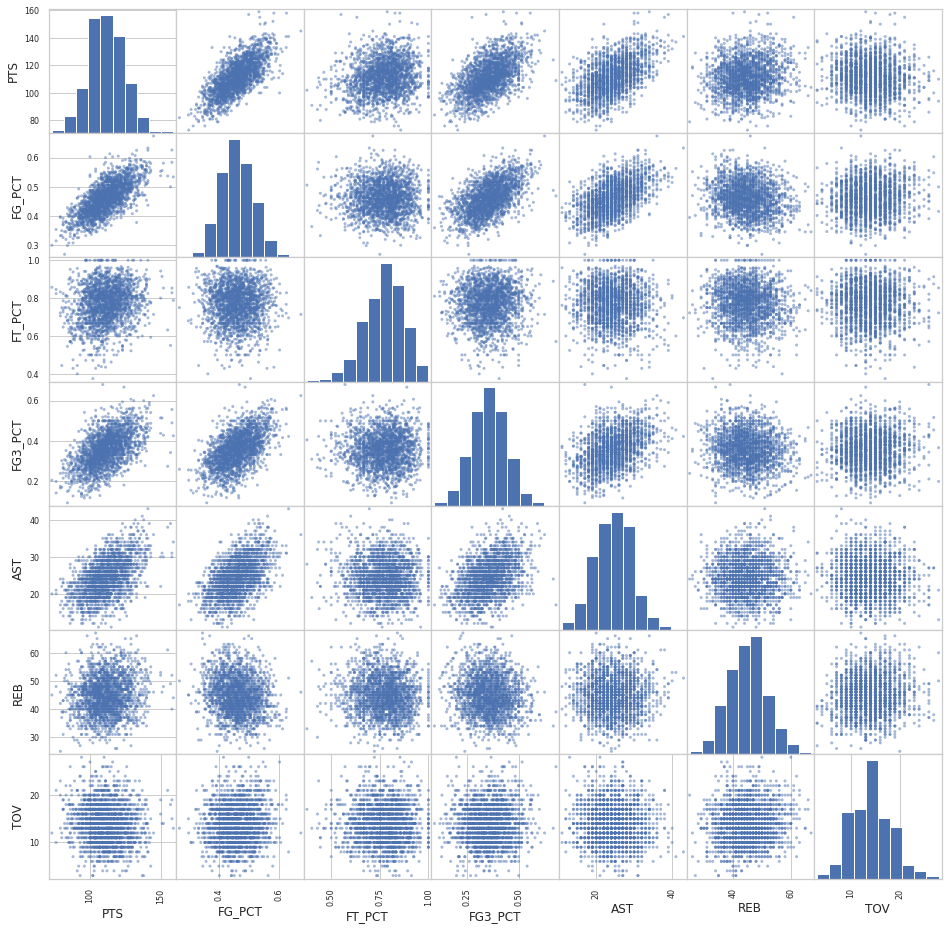

In [34]:
_ = scatter_matrix(games_df[['PTS', 'FG_PCT', 'FT_PCT', 'FG3_PCT', 'AST', 'REB', 'TOV']], figsize=(16, 16))

### Benchmark Model

In [35]:
# drop unnecessary columns
games_df.columns

Index(['GAME_DATE_EST', 'GAME_SEQUENCE', 'GAME_ID', 'TEAM_ID',
       'TEAM_ABBREVIATION', 'TEAM_CITY_NAME', 'TEAM_NAME', 'TEAM_WINS_LOSSES',
       'PTS_QTR1', 'PTS_QTR2', 'PTS_QTR3', 'PTS_QTR4', 'PTS_OT1', 'PTS_OT2',
       'PTS', 'FG_PCT', 'FT_PCT', 'FG3_PCT', 'AST', 'REB', 'TOV', 'IS_WINNER',
       'WINS', 'LOSSES'],
      dtype='object')

In [36]:
avg_cols = [col for col in games_df_final.columns if 'AVG' in col]
avg_cols

['PTS_QTR1_AVG_HOME',
 'PTS_QTR2_AVG_HOME',
 'PTS_QTR3_AVG_HOME',
 'PTS_QTR4_AVG_HOME',
 'PTS_OT1_AVG_HOME',
 'PTS_OT2_AVG_HOME',
 'PTS_AVG_HOME',
 'FG_PCT_AVG_HOME',
 'FT_PCT_AVG_HOME',
 'FG3_PCT_AVG_HOME',
 'AST_AVG_HOME',
 'REB_AVG_HOME',
 'TOV_AVG_HOME',
 'IS_WINNER_AVG_HOME',
 'PTS_QTR1_AVG_AWAY',
 'PTS_QTR2_AVG_AWAY',
 'PTS_QTR3_AVG_AWAY',
 'PTS_QTR4_AVG_AWAY',
 'PTS_OT1_AVG_AWAY',
 'PTS_OT2_AVG_AWAY',
 'PTS_AVG_AWAY',
 'FG_PCT_AVG_AWAY',
 'FT_PCT_AVG_AWAY',
 'FG3_PCT_AVG_AWAY',
 'AST_AVG_AWAY',
 'REB_AVG_AWAY',
 'TOV_AVG_AWAY',
 'IS_WINNER_AVG_AWAY']

In [37]:
# Standardising the data.
from sklearn.preprocessing import scale

# Center to the mean and component wise scale to unit variance.
for col in avg_cols:
    games_df_final[col] = scale(games_df_final[col])

In [40]:
games_df_final.columns

Index(['GAME_DATE_EST_HOME', 'GAME_SEQUENCE_HOME', 'GAME_ID', 'TEAM_ID_HOME',
       'TEAM_ABBREVIATION_HOME', 'TEAM_CITY_NAME_HOME', 'TEAM_NAME_HOME',
       'TEAM_WINS_LOSSES_HOME', 'PTS_QTR1_HOME', 'PTS_QTR2_HOME',
       'PTS_QTR3_HOME', 'PTS_QTR4_HOME', 'PTS_OT1_HOME', 'PTS_OT2_HOME',
       'PTS_HOME', 'FG_PCT_HOME', 'FT_PCT_HOME', 'FG3_PCT_HOME', 'AST_HOME',
       'REB_HOME', 'TOV_HOME', 'IS_WINNER_HOME', 'WINS_HOME', 'LOSSES_HOME',
       'PTS_QTR1_AVG_HOME', 'PTS_QTR2_AVG_HOME', 'PTS_QTR3_AVG_HOME',
       'PTS_QTR4_AVG_HOME', 'PTS_OT1_AVG_HOME', 'PTS_OT2_AVG_HOME',
       'PTS_AVG_HOME', 'FG_PCT_AVG_HOME', 'FT_PCT_AVG_HOME',
       'FG3_PCT_AVG_HOME', 'AST_AVG_HOME', 'REB_AVG_HOME', 'TOV_AVG_HOME',
       'IS_WINNER_AVG_HOME', 'GAME_DATE_EST_AWAY', 'GAME_SEQUENCE_AWAY',
       'TEAM_ID_AWAY', 'TEAM_ABBREVIATION_AWAY', 'TEAM_CITY_NAME_AWAY',
       'TEAM_NAME_AWAY', 'TEAM_WINS_LOSSES_AWAY', 'PTS_QTR1_AWAY',
       'PTS_QTR2_AWAY', 'PTS_QTR3_AWAY', 'PTS_QTR4_AWAY', 'PTS_OT1_AW

In [44]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(games_df_final[avg_cols + ['WINS_HOME', 'LOSSES_HOME', 'WINS_AWAY', 'LOSSES_AWAY']], games_df_final['IS_WINNER_HOME'], test_size=0.3, random_state=0, shuffle=True)
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

### Evaluation

In [45]:
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.75
